# Calculate mean vertical eddy heat transport (w't'_bar) and mean vertical heat transport (w_bar*t_bar) from daily icon output on native grid

This notebook was created during 1st Eerie hackathon in Bremerhaven (9-10 Nov 2023) for WP6 by Stella Bērziņa and Matthias Münnich.

### Pretty important: 
##### Due to the way dask works, your calculations will be done only when you want to create a plot or output the results otherwise. This means that the creation of the plot takes up a LARGE amount of memory (here the memory usage reaches more than 150 GB).
##### This means that you need to: 
1. launch you jupyter notebook with a lot of memory (I use 256 GB) **or**
2. output/compute the inbetween variables and calculations by .compute() or by ouputing xarray as a numpy array 


(2) will ensure that you don't do all calculations at the time of plotting and lead to lower memory usage. However, (2) is not done in this notebook because I am using the big amount of memory. 

In [1]:
import xarray as xr
import numpy as np
import matplotlib.pylab as plt
import matplotlib.cm as cm
from scipy.interpolate import CloughTocher2DInterpolator, LinearNDInterpolator, NearestNDInterpolator
import glob
import intake
from pathlib import Path
import dask
import cmocean.cm as cmo
import pandas as pd
dask.config.set({"array.slicing.split_large_chunks": True}) 
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import sys

eerie_cat=intake.open_catalog("https://raw.githubusercontent.com/eerie-project/intake_catalogues/main/eerie.yaml")


import matplotlib as mpl
import matplotlib.lines as mlines
from matplotlib.cm import get_cmap
from matplotlib import colors 
from matplotlib.colors import ListedColormap
from matplotlib.figure import Figure


sys.path.append("../../")
import nereus as nr

## get icon daily model level data

In [2]:
import intake
eerie_cat=intake.open_catalog("https://raw.githubusercontent.com/eerie-project/intake_catalogues/main/eerie.yaml")
#eerie_cat

In [3]:
eerie_dkrz=eerie_cat["dkrz"]
# for col in eerie_dkrz:
#     print(f"Description of {col}:")
#     print(eerie_dkrz[col].describe()["description"])

In [4]:
eerie_dkrz_disk=eerie_dkrz["disk"]
# for col in eerie_dkrz_disk:
#     print(f"Description of {col}:")
#     print(eerie_dkrz_disk[col].describe()["description"])

In [5]:
cat=eerie_dkrz_disk["model-output"]["icon-esm-er"]
list(cat)

['eerie-control-1950', 'eerie-spinup-1950']

In [6]:
searchdict=dict(
    model="ICON",
    realm="ocean",
    #exp="eerie-control-1950",
    var="w",
    frequency="daily"
)
subcat=cat
for v in searchdict.values():
    subcat=subcat.search(v)
list(subcat)

['eerie-control-1950.atmos.native.2d_daily_max',
 'eerie-control-1950.atmos.native.2d_daily_mean',
 'eerie-control-1950.atmos.native.2d_daily_min',
 'eerie-control-1950.atmos.native.model-level_daily_mean_1',
 'eerie-control-1950.atmos.native.model-level_daily_mean_2',
 'eerie-control-1950.atmos.native.plev19_daily_mean',
 'eerie-control-1950.ocean.gr025.2d_daily_mean',
 'eerie-control-1950.ocean.gr025.2d_daily_square',
 'eerie-control-1950.ocean.gr025.5lev_daily_mean',
 'eerie-control-1950.ocean.gr025.model-level_daily_mean',
 'eerie-control-1950.ocean.native.2d_daily_mean',
 'eerie-control-1950.ocean.native.2d_daily_square',
 'eerie-control-1950.ocean.native.5lev_daily_mean',
 'eerie-control-1950.ocean.native.model-level_daily_mean']

In [7]:
ds=cat["eerie-control-1950.ocean.native.model-level_daily_mean"].to_dask()
ds

<xarray.Dataset>
Dimensions:  (depth: 72, depth_2: 73, time: 3549, ncells: 14886338)
Coordinates:
  * depth    (depth) float64 1.0 3.1 5.45 8.1 ... 5.279e+03 5.546e+03 5.816e+03
  * depth_2  (depth_2) float64 0.0 2.0 4.2 6.7 ... 5.412e+03 5.681e+03 5.951e+03
  * time     (time) datetime64[ns] 2002-01-02 2002-01-03 ... 2011-09-20
Dimensions without coordinates: ncells
Data variables:
    so       (time, depth, ncells) float32 dask.array<chunksize=(3, 3, 2985984), meta=np.ndarray>
    to       (time, depth, ncells) float32 dask.array<chunksize=(3, 3, 2985984), meta=np.ndarray>
    u        (time, depth, ncells) float32 dask.array<chunksize=(3, 3, 2985984), meta=np.ndarray>
    v        (time, depth, ncells) float32 dask.array<chunksize=(3, 3, 2985984), meta=np.ndarray>
    w        (time, depth_2, ncells) float32 dask.array<chunksize=(3, 3, 2985984), meta=np.ndarray>
Attributes:
    CDI:                  Climate Data Interface version 2.2.0 (https://mpime...
    Conventions:          CF-1.6
    comment:              Sapphire Dyamond (k203123) on l40342 (Linux 4.18.0-...
    grid_file_uri:        http://icon-downloads.mpimet.mpg.de/grids/public/mp...
    history:              ./icon at 20230924 141009
    institution:          Max Planck Institute for Meteorology/Deutscher Wett...
    number_of_grid_used:  16
    references:           see MPIM/DWD publications
    source:               git@gitlab.dkrz.de:icon/icon-mpim.git@450227788f06e...
    title:                ICON simulation
    uuidOfHGrid:          375cb0cc-637e-11e8-9d6f-8f41a9b9ff4b

## get grid

In [8]:
grid = xr.open_dataset('/pool/data/ICON/grids/public/mpim/0016/icon_grid_0016_R02B09_O.nc')

## subselect all time steps (nearly 10 years) and one depth (125m, 132m)

The 2 different levels are there because w and t have different depth coords

In [9]:
ds_1d=ds.isel(depth_2=20, depth=20)
ds_1d

<xarray.Dataset>
Dimensions:  (time: 3549, ncells: 14886338)
Coordinates:
    depth    float64 132.9
    depth_2  float64 125.7
  * time     (time) datetime64[ns] 2002-01-02 2002-01-03 ... 2011-09-20
Dimensions without coordinates: ncells
Data variables:
    so       (time, ncells) float32 dask.array<chunksize=(3, 2985984), meta=np.ndarray>
    to       (time, ncells) float32 dask.array<chunksize=(3, 2985984), meta=np.ndarray>
    u        (time, ncells) float32 dask.array<chunksize=(3, 2985984), meta=np.ndarray>
    v        (time, ncells) float32 dask.array<chunksize=(3, 2985984), meta=np.ndarray>
    w        (time, ncells) float32 dask.array<chunksize=(3, 2985984), meta=np.ndarray>
Attributes:
    CDI:                  Climate Data Interface version 2.2.0 (https://mpime...
    Conventions:          CF-1.6
    comment:              Sapphire Dyamond (k203123) on l40342 (Linux 4.18.0-...
    grid_file_uri:        http://icon-downloads.mpimet.mpg.de/grids/public/mp...
    history:              ./icon at 20230924 141009
    institution:          Max Planck Institute for Meteorology/Deutscher Wett...
    number_of_grid_used:  16
    references:           see MPIM/DWD publications
    source:               git@gitlab.dkrz.de:icon/icon-mpim.git@450227788f06e...
    title:                ICON simulation
    uuidOfHGrid:          375cb0cc-637e-11e8-9d6f-8f41a9b9ff4b

## calculate w' and w_bar

In [10]:
w_data=ds_1d.w
w_data

<xarray.DataArray 'w' (time: 3549, ncells: 14886338)>
dask.array<getitem, shape=(3549, 14886338), dtype=float32, chunksize=(3, 2985984), chunktype=numpy.ndarray>
Coordinates:
    depth    float64 132.9
    depth_2  float64 125.7
  * time     (time) datetime64[ns] 2002-01-02 2002-01-03 ... 2011-09-20
Dimensions without coordinates: ncells
Attributes:
    CDI_grid_type:                unstructured
    code:                         255
    long_name:                    vertical velocity at cells
    number_of_grid_in_reference:  1
    standard_name:                w
    units:                        m/s

In [11]:
w_mean=np.mean(w_data, axis=0)

In [12]:
w_anom=w_data-w_mean

## calculate t' and t_bar

In [13]:
t_data=ds_1d.to
t_data

<xarray.DataArray 'to' (time: 3549, ncells: 14886338)>
dask.array<getitem, shape=(3549, 14886338), dtype=float32, chunksize=(3, 2985984), chunktype=numpy.ndarray>
Coordinates:
    depth    float64 132.9
    depth_2  float64 125.7
  * time     (time) datetime64[ns] 2002-01-02 2002-01-03 ... 2011-09-20
Dimensions without coordinates: ncells
Attributes:
    CDI_grid_type:                unstructured
    code:                         2
    long_name:                    sea water potential temperature
    number_of_grid_in_reference:  1
    standard_name:                sea_water_potential_temperature
    units:                        deg C

In [14]:
t_mean=np.mean(t_data, axis=0)

In [15]:
t_anom=t_data-t_mean

## calculate w't'_bar

In [16]:
wt_an=t_anom*w_anom

In [17]:
wt_an_mean=np.mean(wt_an, axis=0)

## plot w't'_bar (prettier plots further ahead in this notebook)

you need to convert dataarray to dataset to attach lat and lon

In [18]:
wt_an_mean_ds=wt_an_mean.to_dataset(name="wt_an_mean_ds")

In [19]:
wt_an_mean_ds.wt_an_mean_ds

<xarray.DataArray 'wt_an_mean_ds' (ncells: 14886338)>
dask.array<mean_agg-aggregate, shape=(14886338,), dtype=float32, chunksize=(2985984,), chunktype=numpy.ndarray>
Coordinates:
    depth    float64 132.9
    depth_2  float64 125.7
Dimensions without coordinates: ncells

add lat and lon to plot

In [20]:
wt_an_mean_ds['lat'] = grid.clon.values*180./np.pi
wt_an_mean_ds['lon'] = grid.clat.values*180./np.pi

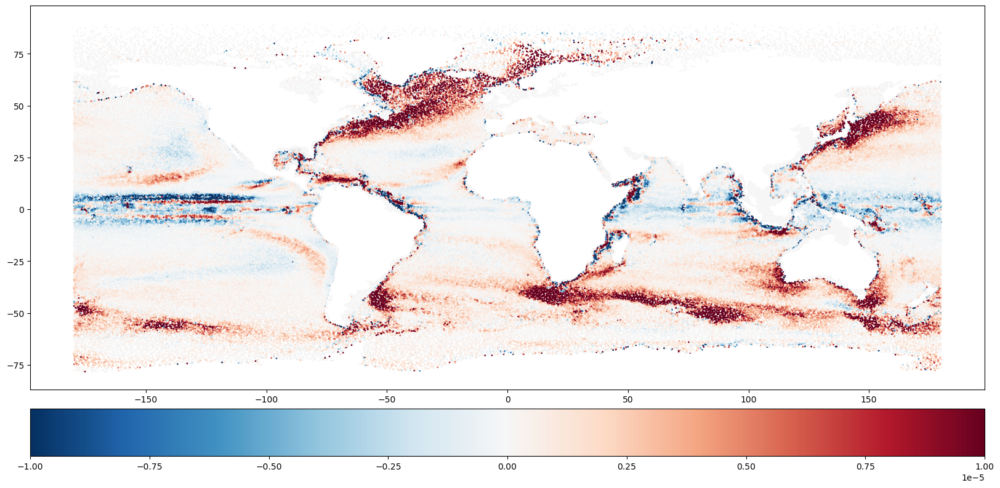

In [21]:
sstep = 100
cmap=get_cmap('RdBu_r')
plt.figure(figsize=(20,10))
plt.scatter(wt_an_mean_ds['lat'][::sstep], wt_an_mean_ds['lon'][::sstep], s=1 , c=wt_an_mean_ds.wt_an_mean_ds[::sstep], 
            vmin= -0.00001, vmax= 0.00001, cmap=cmap)
          # norm=mpl.colors.LogNorm(vmin=, vmax=9.225783e-06))
plt.colorbar(orientation='horizontal', pad=0.04,
             #norm=mpl.colors.LogNorm()
            )


## plot w_bar*t_bar

In [22]:
wt_bar=w_mean*t_mean

In [23]:
wt_bar_ds=wt_bar.to_dataset(name="wbar_tbar")

In [24]:
wt_bar_ds['lat'] = grid.clon.values*180./np.pi
wt_bar_ds['lon'] = grid.clat.values*180./np.pi

Text(0.5, 1.0, '10 year mean of vertical heat transport (up=positive transport)')

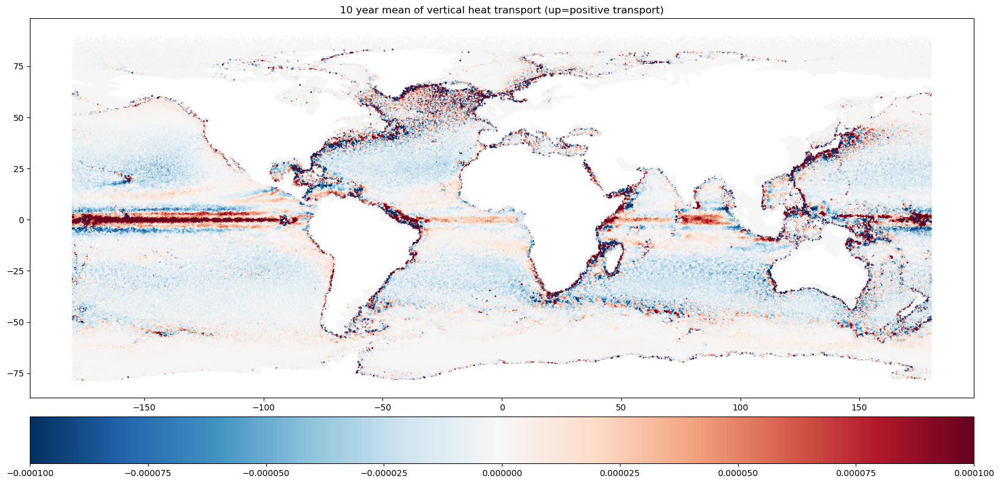

In [25]:
sstep = 10
cmap=get_cmap('RdBu_r')
plt.figure(figsize=(20,10))
plt.scatter(wt_bar_ds['lat'][::sstep], wt_bar_ds['lon'][::sstep], s=1 , c=wt_bar_ds.wbar_tbar[::sstep], 
            vmin= -0.0001, vmax= 0.0001, cmap=cmap)
          # norm=mpl.colors.LogNorm(vmin=, vmax=9.225783e-06))
plt.colorbar(orientation='horizontal', pad=0.04,
             #norm=mpl.colors.LogNorm()
            )
plt.title("10 year mean of vertical heat transport (up=positive transport)")

## southern ocean view

In [26]:
bbox = [-180, 180, -35, -90]

In [27]:
# need this to make the data show up in the maps
grid = xr.open_dataset("/pool/data/ICON/grids/public/mpim/0016/icon_grid_0016_R02B09_O.nc", chunks="auto")
grid["clon"] = np.degrees(grid["clon"])
grid["clat"] = np.degrees(grid["clat"])

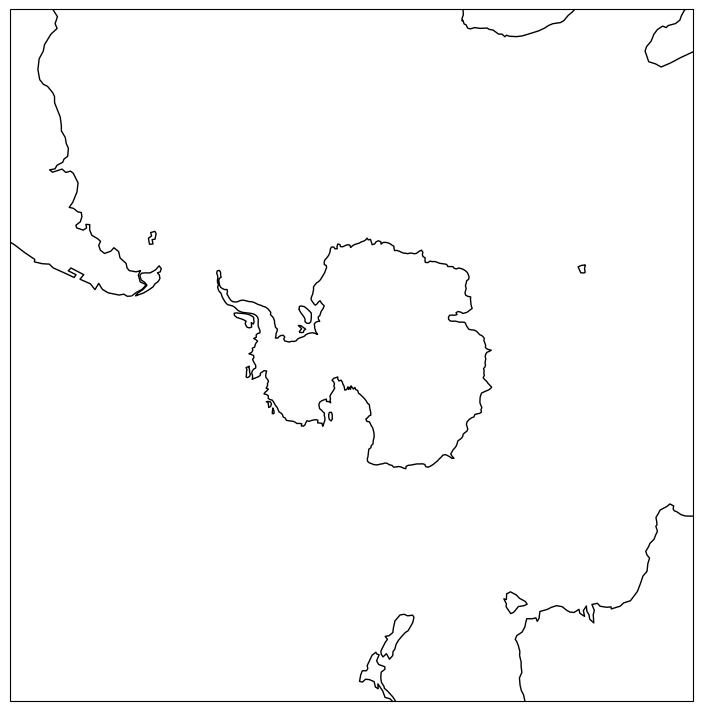

In [28]:
fig, ax = plt.subplots(
            1,
            1,
            subplot_kw=dict(projection=ccrs.SouthPolarStereo()),
            constrained_layout=True,
            figsize=(10,7),
        )
ax.set_extent(bbox, crs=ccrs.PlateCarree())
ax.coastlines()

In [29]:

from pyproj import CRS

In [30]:
## noone knows what this does
custom_south_polar_stereo = CRS.from_string("+proj=stere +lat_0=-90 +lon_0=0 +x_0=0 +y_0=0 +ellps=WGS84 +datum=WGS84 +units=m +no_defs")

In [31]:
x, y, lon2, lat2 = nr.projected_grid_to_platecarree_pyproj(bbox, [500, 500], projection=custom_south_polar_stereo, n_points=100)

In [32]:
distances, inds = nr.create_indexes_and_distances(grid["clon"].values, grid["clat"].values, lon2, lat2, k=1, workers=10)

In [33]:
data_sample = wt_bar_ds["wbar_tbar"]

radius_of_influence=5000
data_interpolated = data_sample.values[inds]
data_interpolated[distances >= radius_of_influence] = np.nan
data_interpolated = data_interpolated.reshape(lon2.shape)
data_interpolated = np.ma.masked_invalid(data_interpolated)

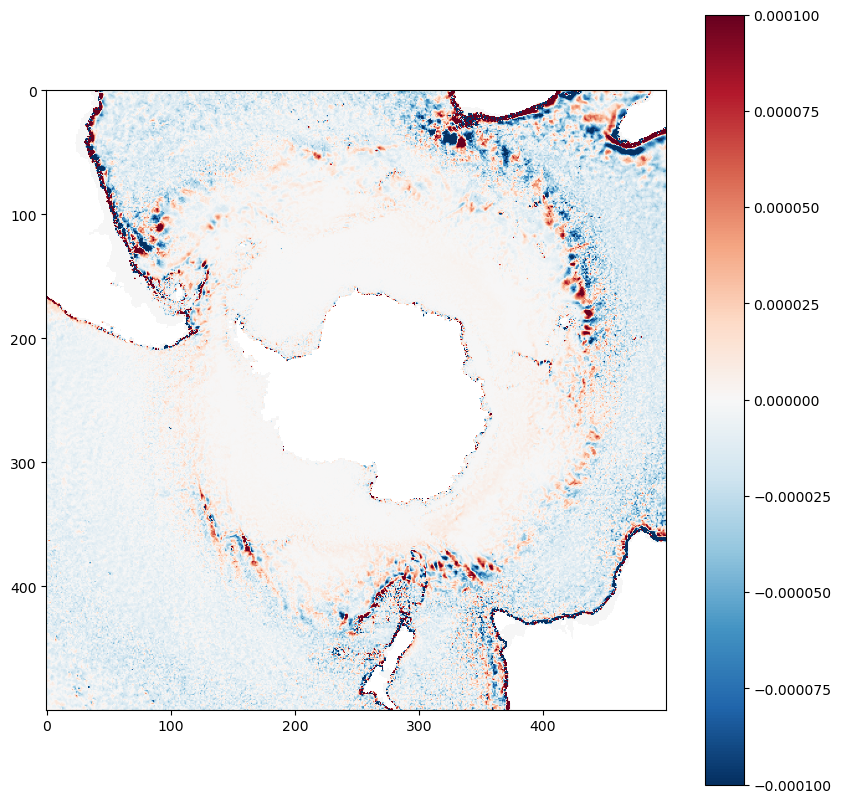

In [35]:
plt.figure(figsize=(10,10))
plt.imshow(np.flipud(data_interpolated), vmin= -0.0001, vmax= 0.0001, cmap=cmap)
plt.colorbar()

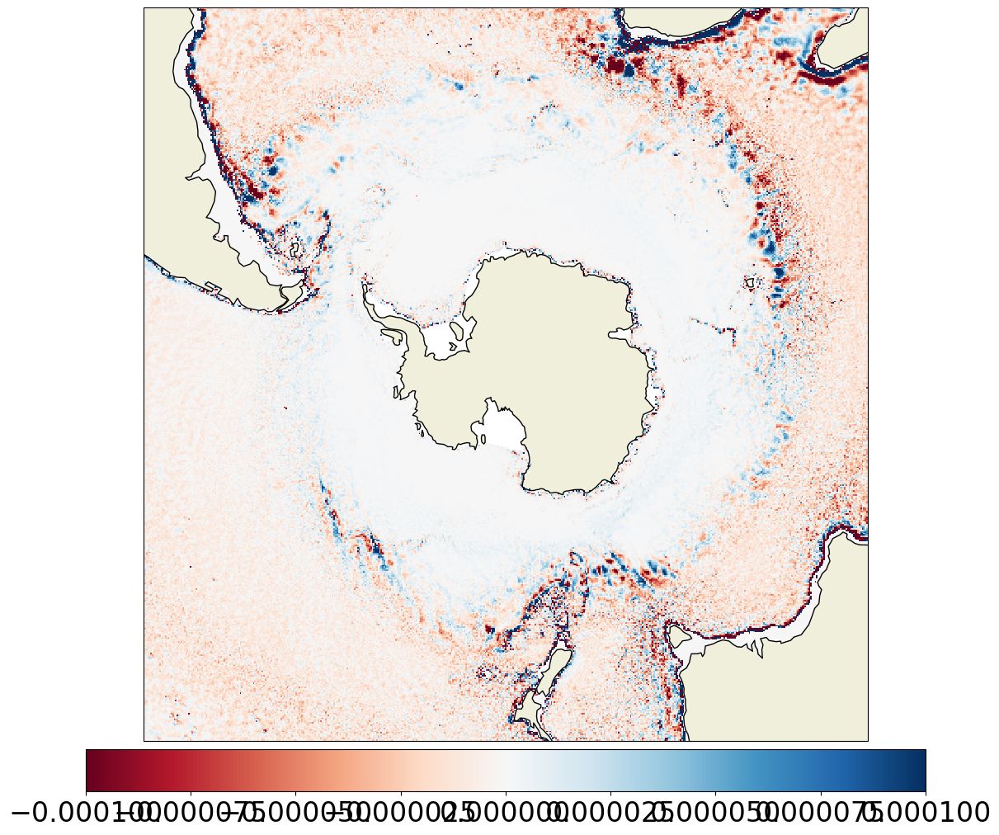

In [36]:
cmap=get_cmap("RdBu")
fig, ax = plt.subplots(
                    1,
                    1,
                    subplot_kw=dict(projection=ccrs.SouthPolarStereo()),
                    constrained_layout=True,
                    figsize=(12, 10),
                )
ax.set_extent(bbox, crs=ccrs.PlateCarree())
im1 = ax.imshow(np.flipud(data_interpolated), cmap=cmap,
                vmin= -0.0001, vmax= 0.0001,
                extent=(x.min(), x.max(), y.min(), y.max()),
                interpolation='nearest', 
               transform=ccrs.SouthPolarStereo())
ax.coastlines()
cb = fig.colorbar(im1, orientation='horizontal', pad=0.01)
cb.ax.tick_params(labelsize=10)
ax.add_feature(cfeature.LAND)

## Now interpolate data and get pretty maps

In [37]:
bbox = [-180, 180, 85, -85]

In [38]:
# need this to make the data show up in the maps
grid = xr.open_dataset("/pool/data/ICON/grids/public/mpim/0016/icon_grid_0016_R02B09_O.nc", chunks="auto")
grid["clon"] = np.degrees(grid["clon"])
grid["clat"] = np.degrees(grid["clat"])

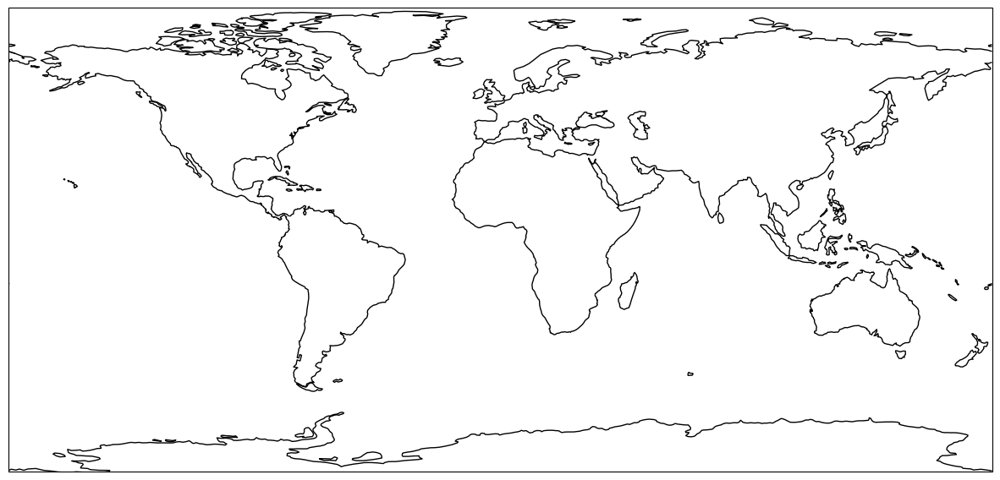

In [39]:
fig, ax = plt.subplots(
            1,
            1,
            subplot_kw=dict(projection=ccrs.PlateCarree()),
            #constrained_layout=True,
            figsize=(15,10),
        )
ax.set_extent(bbox, crs=ccrs.PlateCarree())
ax.coastlines()

In [40]:
from pyproj import CRS

In [41]:
## noone knows what this does
#custom_south_polar_stereo = CRS.from_string("+proj=stere +lat_0=-90 +lon_0=0 +x_0=0 +y_0=0 +ellps=WGS84 +datum=WGS84 +units=m +no_defs")

In [42]:
x, y, lon2, lat2 = nr.projected_grid_to_platecarree_pyproj(bbox, [1000, 1000], projection=ccrs.PlateCarree(), n_points=100) #nearest neigbour

In [43]:
distances, inds = nr.create_indexes_and_distances(grid["clon"].values, grid["clat"].values, lon2, lat2, k=1, workers=10)

In [44]:
data_sample = wt_bar_ds["wbar_tbar"]

radius_of_influence=5000
data_interpolated = data_sample.values[inds]
data_interpolated[distances >= radius_of_influence] = np.nan
data_interpolated = data_interpolated.reshape(lon2.shape)
data_interpolated = np.ma.masked_invalid(data_interpolated)

Just a quick plot to check that stuff works

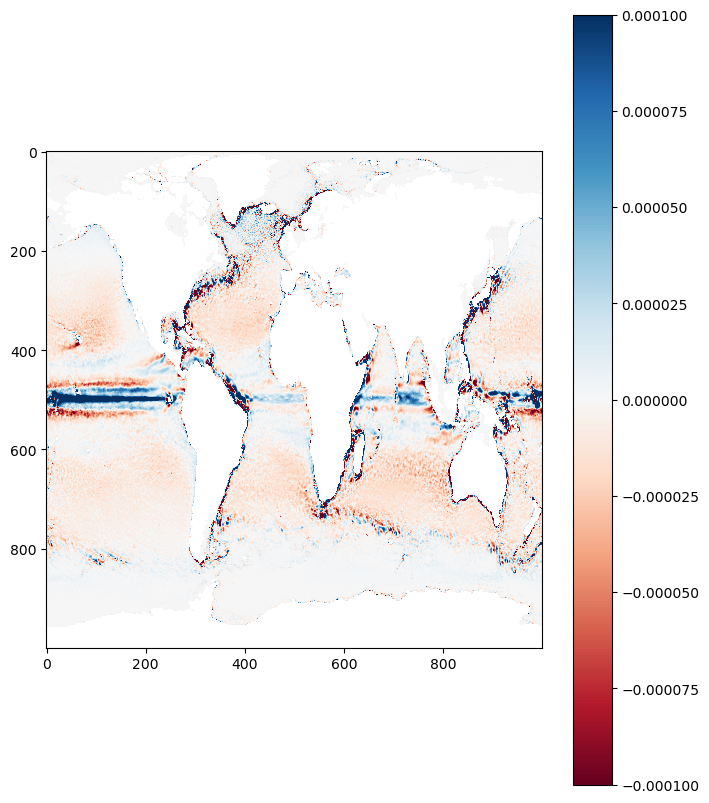

In [45]:
plt.figure(figsize=(8,10))
plt.imshow(np.flipud(data_interpolated), vmin= -0.0001, vmax= 0.0001, cmap=cmap)
plt.colorbar()

A nice plot with propper land outlines

Text(0.5, 1.0, '10 year mean vertical heat transport')

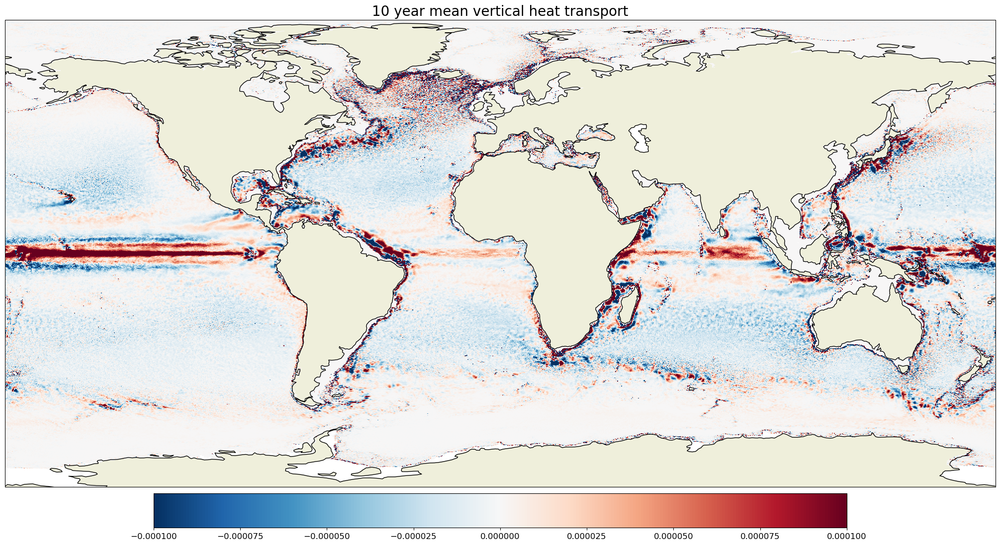

In [46]:
cmap=get_cmap("RdBu_r")
fig, ax = plt.subplots(
                    1,
                    1,
                    subplot_kw=dict(projection=ccrs.PlateCarree()),
                    constrained_layout=True,
                    figsize=(20, 12),
                )
ax.set_extent(bbox, crs=ccrs.PlateCarree())
im1 = ax.imshow(np.flipud(data_interpolated), cmap=cmap,
                vmin= -0.0001, vmax= 0.0001,
                extent=(x.min(), x.max(), y.min(), y.max()),
                interpolation='nearest', 
               transform=ccrs.PlateCarree())
ax.coastlines()
cb = fig.colorbar(im1, orientation='horizontal', pad=0.01, shrink=0.7)
cb.ax.tick_params(labelsize=12)
ax.add_feature(cfeature.LAND)
plt.title('10 year mean vertical heat transport', size=20)

## do the nice map for eddy component of verical heat transport

In [47]:
data_sample = wt_an_mean_ds["wt_an_mean_ds"]

radius_of_influence=5000
data_interpolated = data_sample.values[inds]
data_interpolated[distances >= radius_of_influence] = np.nan
data_interpolated = data_interpolated.reshape(lon2.shape)
data_interpolated = np.ma.masked_invalid(data_interpolated)

In [48]:
data_interpolated.shape

(1000, 1000)

Text(0.5, 1.0, '10 year mean eddy vertical heat transport')

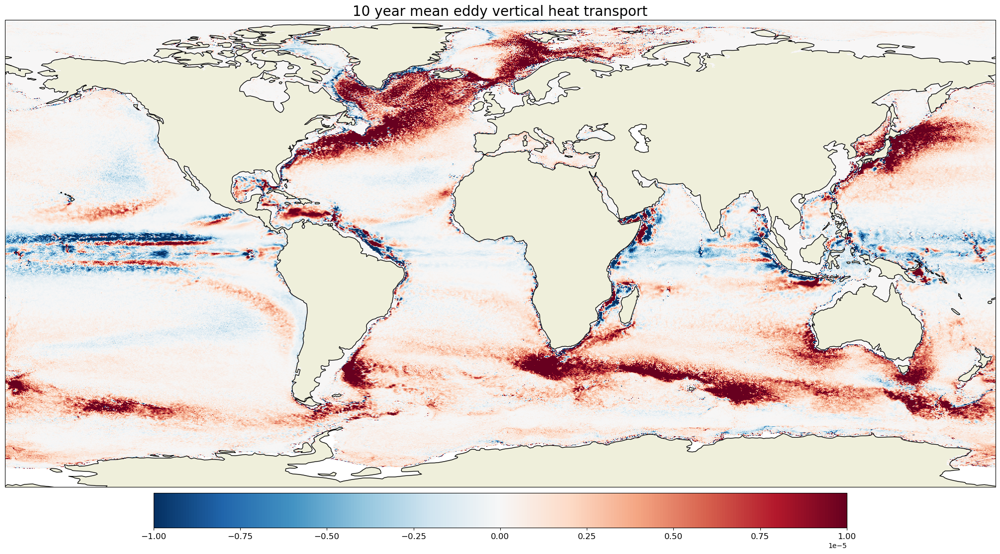

In [49]:
cmap=get_cmap("RdBu_r")
fig, ax = plt.subplots(
                    1,
                    1,
                    subplot_kw=dict(projection=ccrs.PlateCarree()),
                    constrained_layout=True,
                    figsize=(20, 12),
                )
ax.set_extent(bbox, crs=ccrs.PlateCarree())
im1 = ax.imshow(np.flipud(data_interpolated), cmap=cmap,
                vmin= -0.00001, vmax= 0.00001,
                extent=(x.min(), x.max(), y.min(), y.max()),
                interpolation='nearest', 
               transform=ccrs.PlateCarree())
ax.coastlines()
cb = fig.colorbar(im1, orientation='horizontal', pad=0.01, shrink=0.7)
cb.ax.tick_params(labelsize=12)
ax.add_feature(cfeature.LAND)
plt.title('10 year mean eddy vertical heat transport', size=20)

**Note that there is an order of magnitude difference in the colorbar between the two plots!!**

## Create a map with the ratio of w't'_bar / w_bar*t_bar

In [50]:
wt_ratio= wt_an_mean_ds / wt_bar_ds

In [54]:
wt_ratio= wt_an_mean_ds.wt_an_mean_ds / wt_bar_ds.wbar_tbar

In [56]:
wt_ratio=wt_ratio.to_dataset(name="ratio")

In [57]:
wt_ratio['lat'] = grid.clon.values*180./np.pi
wt_ratio['lon'] = grid.clat.values*180./np.pi

/sw/spack-levante/mambaforge-22.9.0-2-Linux-x86_64-kptncg/lib/python3.10/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


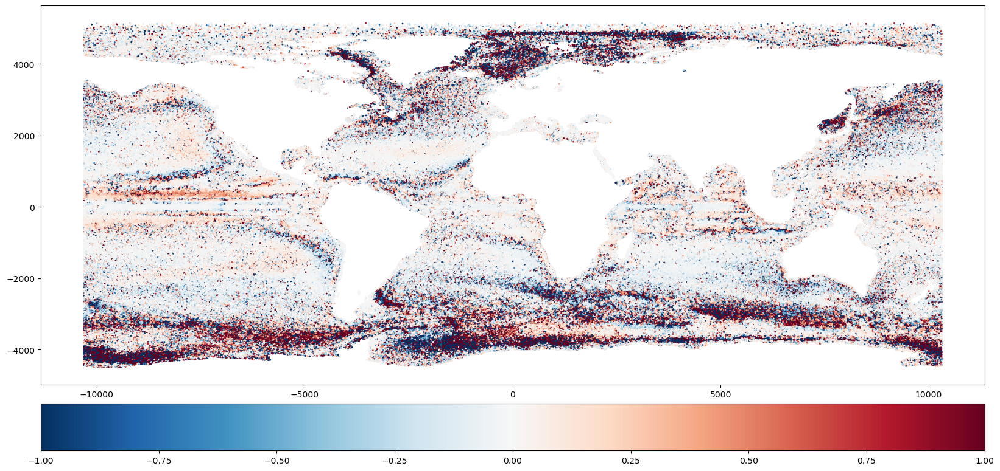

In [58]:
sstep = 10
cmap=get_cmap('RdBu_r')
plt.figure(figsize=(20,10))
plt.scatter(wt_ratio['lat'][::sstep], wt_ratio['lon'][::sstep], s=1 , c=wt_ratio.ratio[::sstep], 
            vmin= -1, vmax= 1, 
            cmap=cmap
           )
          # norm=mpl.colors.LogNorm(vmin=, vmax=9.225783e-06))
plt.colorbar(orientation='horizontal', pad=0.04,
             #norm=mpl.colors.LogNorm()
            )
#plt.title("10 year mean of vertical heat transport (up=positive transport)")

This map is pretty noisy so we want to regrid it to 1 degree resolution

### plot ratio in 1 degree resolution

In [59]:
x, y, lon2, lat2 = nr.projected_grid_to_platecarree_pyproj(bbox, [360, 180], projection=ccrs.PlateCarree(), n_points=100)

In [60]:
distances, inds = nr.create_indexes_and_distances(grid["clon"].values, grid["clat"].values, lon2, lat2, k=1, workers=10)

In [61]:
data_sample = wt_ratio["ratio"]

radius_of_influence=5000
data_interpolated = data_sample.values[inds]
data_interpolated[distances >= radius_of_influence] = np.nan
data_interpolated = data_interpolated.reshape(lon2.shape)
data_interpolated = np.ma.masked_invalid(data_interpolated)

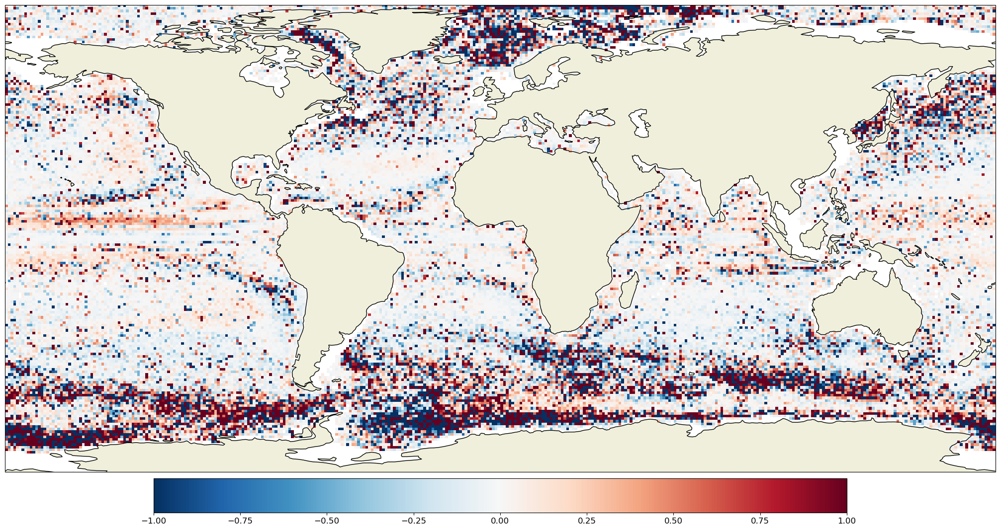

In [62]:
cmap=get_cmap("RdBu_r")
fig, ax = plt.subplots(
                    1,
                    1,
                    subplot_kw=dict(projection=ccrs.PlateCarree()),
                    constrained_layout=True,
                    figsize=(20, 12),
                )
ax.set_extent(bbox, crs=ccrs.PlateCarree())
im1 = ax.imshow(np.flipud(data_interpolated), cmap=cmap,
                vmin= -1, vmax= 1,
                extent=(x.min(), x.max(), y.min(), y.max()),
                interpolation='nearest', 
               transform=ccrs.PlateCarree())
ax.coastlines()
cb = fig.colorbar(im1, orientation='horizontal', pad=0.01, shrink=0.7)
cb.ax.tick_params(labelsize=12)
ax.add_feature(cfeature.LAND)
#plt.title('10 year mean eddy vertical heat transport', size=20)